In [1]:
from tensorflow import keras
from tensorflow.keras import layers
import pathlib
from tensorflow.keras.utils import image_dataset_from_directory

import pandas as pd
import pathlib
from pathlib import Path

import numpy as np
import pandas as pd

# plotting modules
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import plotly as plotly
plotly.offline.init_notebook_mode()

from tensorflow import keras
from tensorflow.keras import layers

import tensorflow as tf
from keras.utils import to_categorical
from keras.models import load_model

import plotly.graph_objects as go
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dense
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_curve, ConfusionMatrixDisplay

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
# turn off gpu logging
tf.debugging.set_log_device_placement(False)

# Framing the Problem

Breast cancer is one of the leading causes of cancer-related deaths worldwide with the ***`Invasive Ductal Carcinoma (IDC)`*** being the most common type. Early detection is crucial for effective treatment and improved patient outcomes. However, current detection methods often lack accuracy and reliability. Our project aims to improve breast cancer detection using deep learning techniques

# Getting the data
The original dataset consisted of 162 whole mount slide images of Breast Cancer (BCa) specimens scanned at 40x. From that, 277,524 patches of size 50 x 50 were extracted (198,738 IDC negative and 78,786 IDC positive). Each patch’s file name is of the format: u_xX_yY_classC.png — > example 10253_idx5_x1351_y1101_class0.png . Where u is the patient ID (10253_idx5), X is the x-coordinate of where this patch was cropped from, Y is the y-coordinate of where this patch was cropped from, and C indicates the class where 0 is non-IDC and 1 is IDC.

In [4]:
data_folder = pathlib.Path("../../../../../Downloads/hispathology")

In [5]:
len(list(data_folder.glob('*')))

280

In [6]:
list(data_folder.glob('*'))[:10]

[WindowsPath('../../../../../Downloads/hispathology/10253'),
 WindowsPath('../../../../../Downloads/hispathology/10254'),
 WindowsPath('../../../../../Downloads/hispathology/10255'),
 WindowsPath('../../../../../Downloads/hispathology/10256'),
 WindowsPath('../../../../../Downloads/hispathology/10257'),
 WindowsPath('../../../../../Downloads/hispathology/10258'),
 WindowsPath('../../../../../Downloads/hispathology/10259'),
 WindowsPath('../../../../../Downloads/hispathology/10260'),
 WindowsPath('../../../../../Downloads/hispathology/10261'),
 WindowsPath('../../../../../Downloads/hispathology/10262')]

In [7]:
patient_data_folder = data_folder / 'IDC_regular_ps50_idx5'

In [8]:
len(list(patient_data_folder.glob('*')))

279

In [9]:
patient_folders = [x for x in patient_data_folder.glob('*') if x.is_dir()]
patient_folders = [x.name for x in patient_folders]
patient_folders[:10]

['10253',
 '10254',
 '10255',
 '10256',
 '10257',
 '10258',
 '10259',
 '10260',
 '10261',
 '10262']

In [10]:
total_images = 0
for patient_folder in patient_folders:
    patient_folder_path = patient_data_folder / patient_folder
    subfolders = ['0', '1']  # List of subfolders you're interested in
    for subfolder in subfolders:
        subfolder_path = patient_folder_path / subfolder
        images = list(subfolder_path.glob('*'))
        total_images += len(images)
        print(f'Patient folder {patient_folder}/{subfolder} contains {len(images)} images.')


Patient folder 10253/0 contains 479 images.
Patient folder 10253/1 contains 70 images.
Patient folder 10254/0 contains 772 images.
Patient folder 10254/1 contains 76 images.
Patient folder 10255/0 contains 181 images.
Patient folder 10255/1 contains 91 images.
Patient folder 10256/0 contains 351 images.
Patient folder 10256/1 contains 117 images.
Patient folder 10257/0 contains 427 images.
Patient folder 10257/1 contains 208 images.
Patient folder 10258/0 contains 422 images.
Patient folder 10258/1 contains 108 images.
Patient folder 10259/0 contains 1434 images.
Patient folder 10259/1 contains 31 images.
Patient folder 10260/0 contains 928 images.
Patient folder 10260/1 contains 361 images.
Patient folder 10261/0 contains 590 images.
Patient folder 10261/1 contains 56 images.
Patient folder 10262/0 contains 1053 images.
Patient folder 10262/1 contains 754 images.
Patient folder 10264/0 contains 617 images.
Patient folder 10264/1 contains 587 images.
Patient folder 10268/0 contains 208

Patient folder 10305/0 contains 1802 images.
Patient folder 10305/1 contains 19 images.
Patient folder 10306/0 contains 751 images.
Patient folder 10306/1 contains 273 images.
Patient folder 10307/0 contains 915 images.
Patient folder 10307/1 contains 80 images.
Patient folder 10308/0 contains 1383 images.
Patient folder 10308/1 contains 895 images.
Patient folder 12241/0 contains 37 images.
Patient folder 12241/1 contains 115 images.
Patient folder 12242/0 contains 668 images.
Patient folder 12242/1 contains 429 images.
Patient folder 12626/0 contains 1088 images.
Patient folder 12626/1 contains 254 images.
Patient folder 12748/0 contains 168 images.
Patient folder 12748/1 contains 198 images.
Patient folder 12749/0 contains 1199 images.
Patient folder 12749/1 contains 563 images.
Patient folder 12750/0 contains 1413 images.
Patient folder 12750/1 contains 21 images.
Patient folder 12751/0 contains 849 images.
Patient folder 12751/1 contains 967 images.
Patient folder 12752/0 contains

In [11]:
print(f'Total number of images in all subfolders is {total_images}.')

Total number of images in all subfolders is 277524.


In [12]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.image import imread  # or from PIL import Image if you prefer


In [13]:

patient_folders = os.listdir(patient_data_folder)  # List of patient folder names

# Initialize an empty list to collect data
data_list = []

# Iterate over patient folders and their subfolders
for patient_id in patient_folders:
    patient_path = patient_data_folder / patient_id
    for target in ['0', '1']:
        class_path = patient_path / target
        image_files = os.listdir(class_path)
        for image_file in image_files:
            image_path = class_path / image_file
            # Append a new dict to the list
            data_list.append({
                "patient_id": patient_id,
                "path": str(image_path),
                "target": int(target)
            })

# Create the DataFrame from the list of dicts
dataset = pd.DataFrame(data_list)

dataset.head()

,patient_id,path,target
0,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
1,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
2,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
3,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
4,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0


In [14]:
dataset.shape

(277524, 3)

# Exploratory Data Analysis - Breast Cancer Detection

## Data Loading
- Total number of images: 277,524
- Image dimensions: 50x50 pixels
- Labels: IDC (Invasive Ductal Carcinoma) and non-IDC

## Data Inspection
- Checked for missing values or inconsistencies
- Ensured data integrity

## Class Distribution
- Balanced classes: 50% IDC, 50% non-IDC
- Visualize class distribution using histograms or pie charts

## Data Visualization
- Sample images: IDC-positive tissue slices, IDC-negative tissue slices
- Explore characteristics such as cell morphology, texture, and density

## Feature Extraction
- Extract texture features (e.g., Haralick features), shape features, and color features from images
- Visualize extracted features using histograms or heatmaps


In [15]:
dataset.target.value_counts()

target
0    198738
1     78786
Name: count, dtype: int64

In [16]:
import plotly.graph_objects as go

# Calculate the percentage of cancerous patches for each patient
cancer_perc = dataset.groupby("patient_id")['target'].value_counts(normalize=True).unstack()

# Number of patches per patient
patches_per_patient = dataset.groupby("patient_id").size()

# Plot 1: Histogram of the number of patches per patient
fig1 = go.Figure(go.Histogram(x=patches_per_patient, nbinsx=30, marker_color="steelblue"))
fig1.update_layout(title_text="How many patches do we have per patient?", xaxis_title="Number of Patches", yaxis_title="Frequency", height=600, width=800)
fig1.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig1.show()

# Plot 2: Histogram of the percentage of cancerous patches per patient
# Ensure there is a '1' column for cancerous patches; if not, create it with 0 values
if 1 not in cancer_perc.columns:
    cancer_perc[1] = 0
fig2 = go.Figure(go.Histogram(x=cancer_perc[1], nbinsx=30, marker_color="mediumseagreen"))
fig2.update_layout(title_text="How much percentage of an image is covered by IDC?", xaxis_title="% of Patches with IDC", yaxis_title="Frequency", height=600, width=800)
fig2.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig2.show()

# Plot 3: Count plot of non-cancerous vs. cancerous patches
fig3 = go.Figure(go.Histogram(x=dataset['target'], nbinsx=2, marker_color=["darkorchid", "darkorange"]))
fig3.update_layout(title_text="How many patches show IDC?", xaxis_title="No (0) vs Yes (1)", yaxis_title="Count", height=600, width=800)
fig3.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig3.show()


## Examining the Patches

In [17]:
healthy = np.random.choice(dataset[dataset.target==0].index.values, size=50, replace=False)
non_healthy = np.random.choice(dataset[dataset.target==1].index.values, size=50, replace=False)


Healthy Patches

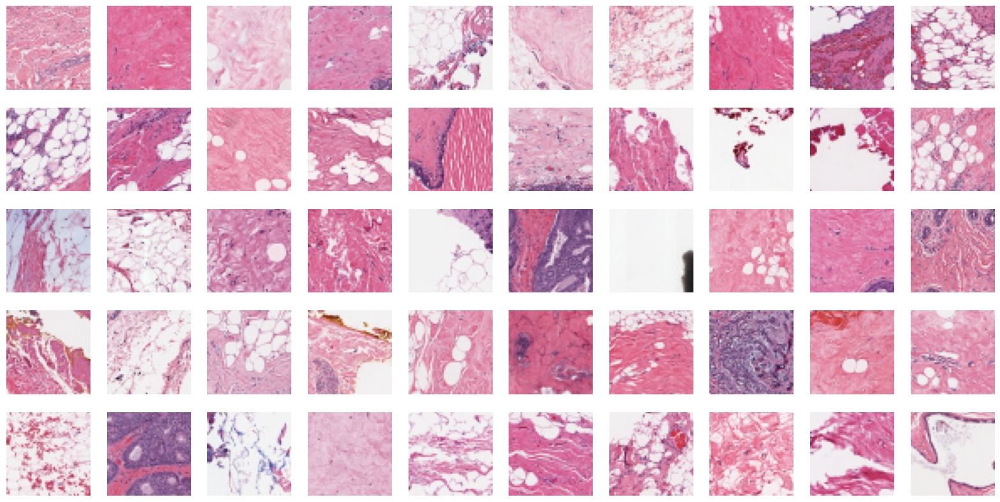

In [18]:

fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = healthy[m + 10*n]  # Index of the sample to display
        image_path = dataset.loc[idx, "path"]  # Get the path of the image
        image = imread(image_path)  # Load the image
        ax[n, m].imshow(image)  # Display the image
        ax[n, m].axis('off')  # Hide the axes

plt.show()

## Cancer Patches

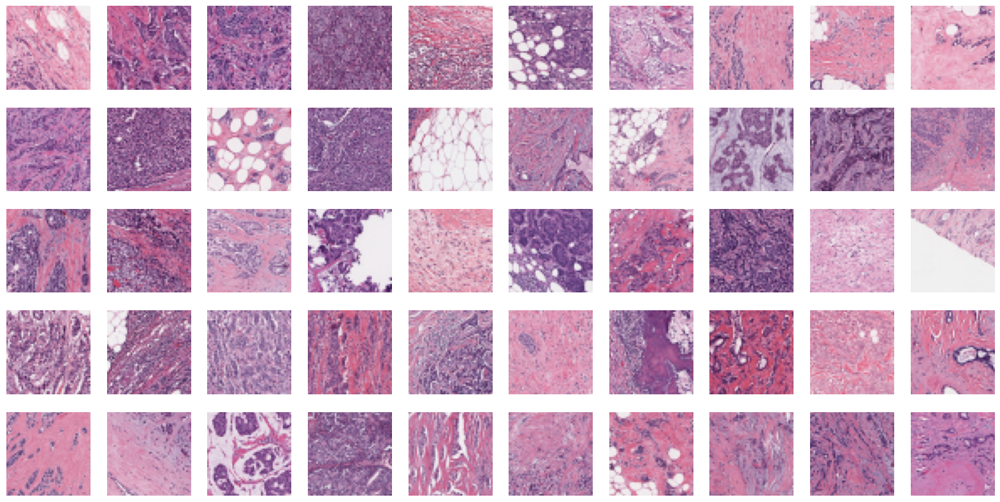

In [19]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = non_healthy[m + 10*n]  # Index of the sample to display
        image_path = dataset.loc[idx, "path"]  # Get the path of the image
        image = imread(image_path)  # Load the image
        ax[n, m].imshow(image)  # Display the image
        ax[n, m].axis('off')  # Hide the axes

plt.show()

So far we have looked at each patch of the breast, now let us attempt to visualize the entire breast tissue.

In [20]:
import pandas as pd
import numpy as np

def extract_coords(df):
    # Create a copy of the DataFrame to avoid SettingWithCopyWarning
    df_copy = df.copy()
    
    # Extract the x and y coordinates from the file paths
    coord = df_copy['path'].str.rsplit("_", n=4, expand=True)
    coord = coord.drop([0, 1, 4], axis=1)  # Drop unused parts
    coord = coord.rename({2: "x", 3: "y"}, axis=1)  # Rename columns to 'x' and 'y'
    coord['x'] = coord['x'].str.replace("x", "", case=False).astype(int)  # Convert x values to integers
    coord['y'] = coord['y'].str.replace("y", "", case=False).astype(int)  # Convert y values to integers
    
    # Merge the coordinates back into the original DataFrame using .loc to avoid SettingWithCopyWarning
    df_copy.loc[:, 'x'] = coord['x']
    df_copy.loc[:, 'y'] = coord['y']
    
    return df_copy

def get_patient_dataframe(patient_id, dataset):
    # Filter the dataset for the given patient_id
    patient_df = dataset[dataset['patient_id'] == patient_id].copy()
    
    # Extract coordinates and targets
    patient_df = extract_coords(patient_df)
    
    return patient_df


In [21]:
get_patient_dataframe("10253", dataset).head()

,patient_id,path,target,x,y
0,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1001
1,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1051
2,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1101
3,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1151
4,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0,1001,1201


Binary target visualisation per tissue slice

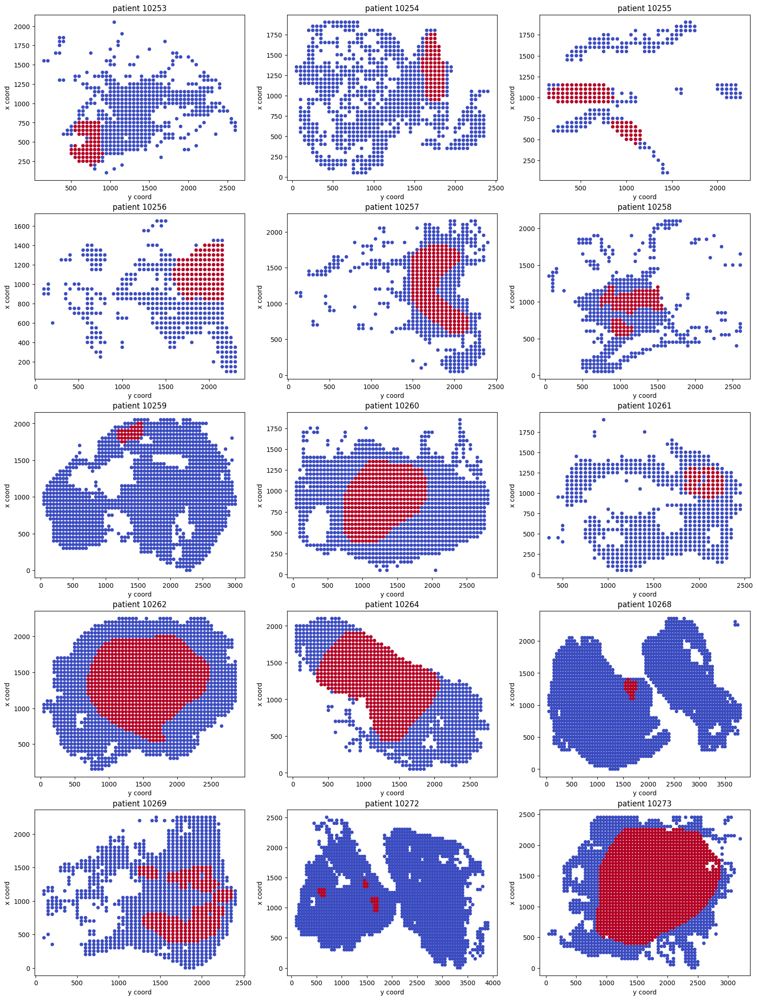

In [22]:

fig, ax = plt.subplots(5, 3, figsize=(20, 27))

# Get unique patient IDs from your dataset
patient_ids = dataset.patient_id.unique()

for n in range(5):
    for m in range(3):
        patient_id = patient_ids[m + 3*n]  # Select patient ID
        example_df = get_patient_dataframe(patient_id, dataset)  # Get the DataFrame for this patient
        
        # Plot scatter plot of x-y coordinates colored by target
        ax[n, m].scatter(example_df.x.values, example_df.y.values, c=example_df.target.values, cmap="coolwarm", s=20)
        ax[n, m].set_title("patient " + patient_id)
        ax[n, m].set_xlabel("y coord")
        ax[n, m].set_ylabel("x coord")

Insights
Sometimes we don't have the full tissue information. It seems that tissue patches have been discarded or lost during preparation.
Reading the paper (link!) that seems to be related to this data this could also be part of the preprocessing.

Visualising the breast tissue images 
Ok, now it's time to go one step deeper with our EDA. Given the coordinates of image patches we could try to reconstruct the whole tissue image (not only the targets).

In [23]:
def visualise_breast_tissue(patient_id, pred_df=None):
    example_df = get_patient_dataframe(patient_id, dataset)
    max_point = [example_df.y.max() - 1, example_df.x.max() - 1]
    grid = 255 * np.ones(shape=(max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    mask = 255 * np.ones(shape=(max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    

    if pred_df is not None:
        patient_df = pred_df[pred_df['patient_id'] == patient_id].copy()
    mask_proba = np.zeros(shape=(max_point[0] + 50, max_point[1] + 50, 1)).astype(float)

    broken_patches = []
    for n in range(len(example_df)):
        try:
            image = imread(example_df.path.values[n])
            # Convert the image from normalized floats to uint8
            image = (image * 255).astype(np.uint8)

            target = example_df.target.values[n]
            
            x_coord, y_coord = int(example_df.x.values[n]), int(example_df.y.values[n])
            x_start, y_start = x_coord - 1, y_coord - 1
            x_end, y_end = x_start + 50, y_start + 50

            grid[y_start:y_end, x_start:x_end] = image
           
            if target == 1:
                mask[y_start:y_end, x_start:x_end, 0] = 250
                mask[y_start:y_end, x_start:x_end, 1] = 0
                mask[y_start:y_end, x_start:x_end, 2] = 0
            if pred_df is not None:
                proba = patient_df[(patient_df['x'] == x_coord) & (patient_df['y'] == y_coord)]['proba']
                mask_proba[y_start:y_end, x_start:x_end, 0] = float(proba)

        except ValueError:
            broken_patches.append(example_df.iloc[n]['path'])

    return grid, mask, broken_patches, mask_proba

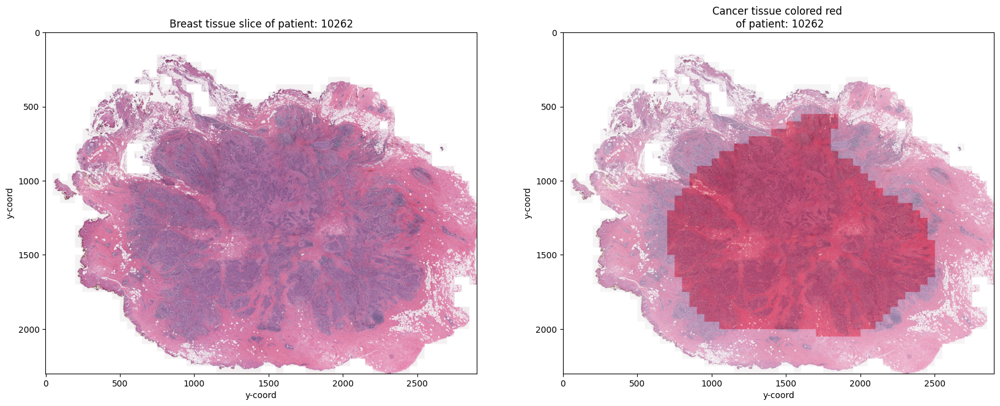

In [24]:
patient_id = '10262'
grid, mask, broken_patches, mask_proba = visualise_breast_tissue(patient_id)

fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[0].grid(False)
ax[1].grid(False)
for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")
ax[0].set_title("Breast tissue slice of patient: " + patient_id)
ax[1].set_title("Cancer tissue colored red \n of patient: " + patient_id);


# Preparing the Dataset

In [25]:
dataset

,patient_id,path,target
0,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
1,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
2,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
3,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
4,10253,..\..\..\..\..\Downloads\hispathology\IDC_regu...,0
...,...,...,...
277519,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1
277520,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1
277521,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1
277522,9383,..\..\..\..\..\Downloads\hispathology\IDC_regu...,1


In [26]:
# Separate the dataset into two based on the target value
class_0_df = dataset[dataset['target'] == 0]
class_1_df = dataset[dataset['target'] == 1]

# Sample 2500 instances from each class
class_0_sample = class_0_df.sample(78786, random_state=42)
class_1_sample = class_1_df.sample(78786, random_state=42)

# Concatenate the two samples to create a balanced smaller dataset
small_dataset = pd.concat([class_0_sample, class_1_sample])

# Shuffle the small_dataset to mix class_0 and class_1 samples
small_dataset = small_dataset.sample(frac=1, random_state=42).reset_index(drop=True)


In [27]:
X = dataset.drop(columns=['target'])
y = dataset['target'].astype(str)
y = pd.DataFrame(y)

In [28]:
# show the rgb values of the images

In [29]:
from sklearn.model_selection import train_test_split

# First, split into train and temp (temp will be further split into validation and test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)

# Now split the temp set into validation and test
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


In [30]:
train_df = pd.concat([X_train, y_train], axis=1)
val_df = pd.concat([X_val, y_val], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

In [31]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# train_datagen = ImageDataGenerator(
#     # rescale=1./255,
#     horizontal_flip=True,
#     vertical_flip=True,
#     # Add other transformations here
# )

train_datagen = ImageDataGenerator(
    rescale=1./255,
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=False,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=False,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    rotation_range=20,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
    horizontal_flip=True,  # randomly flip images
    vertical_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)


In [32]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(180,180))

valid_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(180,180))

test_generator = val_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="path",
    y_col="target",
    batch_size=32,
    seed=42,
    shuffle=False,
    class_mode="categorical",
    target_size=(180,180))

Found 194266 validated image filenames belonging to 2 classes.
Found 41629 validated image filenames belonging to 2 classes.
Found 41629 validated image filenames belonging to 2 classes.


In [33]:
# Fetch the first batch of images and labels
images, labels = next(train_generator)

# Inspect the first image in the batch
first_image = images[0]

# Check the maximum and minimum values
max_value = first_image.max()
min_value = first_image.min()

print(f"Maximum pixel value: {max_value}")
print(f"Minimum pixel value: {min_value}")


Maximum pixel value: 0.9647059440612793
Minimum pixel value: 0.4274510145187378


In [34]:
# from imblearn.over_sampling import RandomOverSampler

# ros = RandomOverSampler(random_state=42)
# X_res, y_res = ros.fit_resample(X.reshape(X.shape[0], -1), y)  # Reshape X to 2D for resampling
# X_res = X_res.reshape(-1, 50, 50, 3)  # Reshape X back to its original shape


In [35]:
y_train

,target
229750,0
248643,0
240698,0
101286,0
49142,0
...,...
119879,0
259178,0
131932,0
146867,0


In [36]:
np.unique(y_train)

array(['0', '1'], dtype=object)

In [37]:
from sklearn.utils import class_weight
import numpy as np

# Calculate class weights
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train), 
    y=y_train['target'])

class_weights = dict(enumerate(class_weights))

In [38]:
class_weights

{0: 0.6985221674876847, 1: 1.7593052109181142}

# Modelling

In [39]:
# import conv2d, maxpooling2d, flatten, dense, dropout
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(180, 180, 3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

model.compile(loss=keras.losses.categorical_crossentropy,
    optimizer=keras.optimizers.Adadelta(),
    metrics=['accuracy'])

In [40]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 176, 176, 64)      18496     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 88, 88, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 88, 88, 64)        0         
                                                                 
 flatten (Flatten)           (None, 495616)            0         
                                                                 
 dense (Dense)               (None, 128)               63438976  
                                                        

In [41]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/convnet_from_scratch_with_augmentation.keras",
        save_best_only=True,
        monitor="val_loss")
]

history = model.fit(
    train_generator,
    batch_size=1024,
    epochs=20,
    validation_data=valid_generator,
    class_weight=class_weights,
    callbacks=callbacks)


Epoch 1/20
6071/6071 [==============================] - 816s 133ms/step - loss: 0.5404 - accuracy: 0.7557 - val_loss: 0.4911 - val_accuracy: 0.7863
Epoch 2/20
6071/6071 [==============================] - 814s 134ms/step - loss: 0.4887 - accuracy: 0.7908 - val_loss: 0.4589 - val_accuracy: 0.8010
Epoch 3/20
6071/6071 [==============================] - 812s 134ms/step - loss: 0.4798 - accuracy: 0.7937 - val_loss: 0.4736 - val_accuracy: 0.7901
Epoch 4/20
6071/6071 [==============================] - 811s 134ms/step - loss: 0.4756 - accuracy: 0.7945 - val_loss: 0.4402 - val_accuracy: 0.8053
Epoch 5/20
6071/6071 [==============================] - 812s 134ms/step - loss: 0.4711 - accuracy: 0.7959 - val_loss: 0.4219 - val_accuracy: 0.8148
Epoch 6/20
6071/6071 [==============================] - 814s 134ms/step - loss: 0.4693 - accuracy: 0.7965 - val_loss: 0.4410 - val_accuracy: 0.8050
Epoch 7/20
6071/6071 [==============================] - 811s 134ms/step - loss: 0.4668 - accuracy: 0.7976 - val_

In [42]:
history_df = pd.DataFrame(history.history)
history_df.insert(0, 'epoch', range(1, len(history_df) + 1))
history_df

,epoch,loss,accuracy,val_loss,val_accuracy
0,1,0.540423,0.755742,0.491052,0.786327
1,2,0.488688,0.790828,0.458904,0.801004
2,3,0.479815,0.793685,0.473591,0.790122
3,4,0.475550,0.794473,0.440178,0.805256
4,5,0.471101,0.795940,0.421867,0.814793
5,6,0.469316,0.796485,0.441047,0.805040
6,7,0.466818,0.797602,0.431642,0.808139
7,8,0.464185,0.798508,0.441308,0.804055
8,9,0.463125,0.799167,0.414297,0.819789
9,10,0.460947,0.799857,0.446607,0.796536


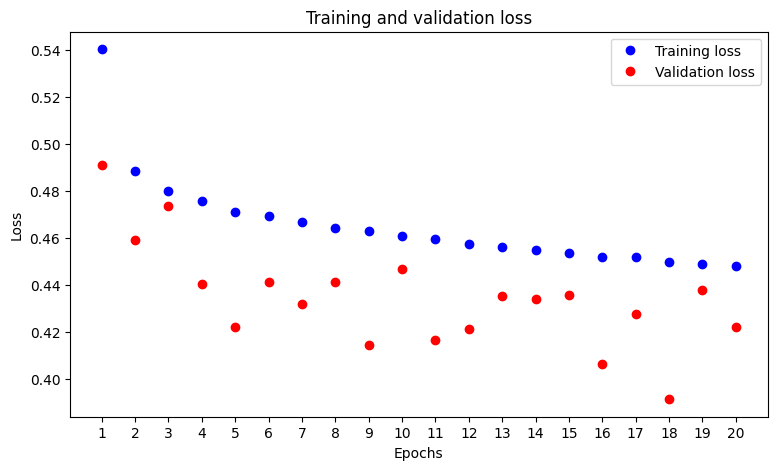

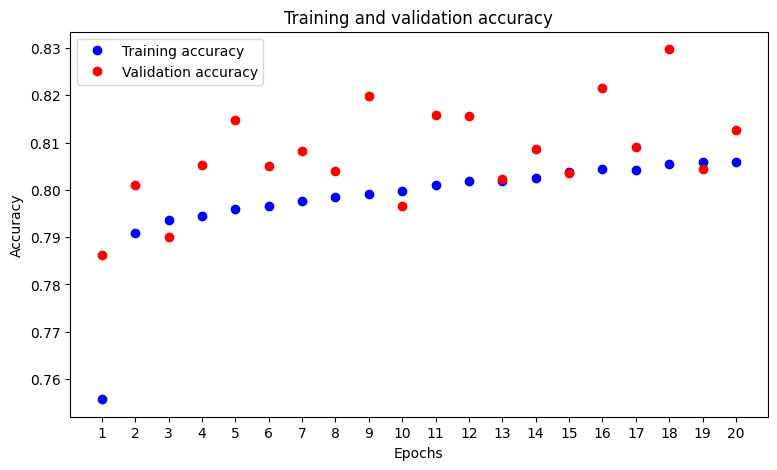

In [43]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Plot the training and validation loss
plt.figure(figsize=(9, 5))
values = history_df['accuracy']
epochs = range(1, len(values) + 1)
plt.plot(epochs, history_df['loss'], 'bo', label='Training loss')
plt.plot(epochs, history_df['val_loss'], 'ro', label='Validation loss')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Loss')
plt.legend()
plt.title('Training and validation loss')
plt.show()

# Plot the training and validation accuracy
plt.figure(figsize=(9, 5))
plt.plot(epochs, history_df['accuracy'], 'bo', label='Training accuracy')
plt.plot(epochs, history_df['val_accuracy'], 'ro', label='Validation accuracy')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and validation accuracy')
plt.show()

In [44]:
# evaluate the model
model.evaluate(test_generator)

1301/1301 [==============================] - 41s 32ms/step - loss: 0.4219 - accuracy: 0.8128


[0.4218797981739044, 0.8128228187561035]

1301/1301 [==============================] - 26s 20ms/step
              precision    recall  f1-score   support

           0       0.91      0.82      0.86     29959
           1       0.63      0.79      0.70     11670

    accuracy                           0.81     41629
   macro avg       0.77      0.80      0.78     41629
weighted avg       0.83      0.81      0.82     41629



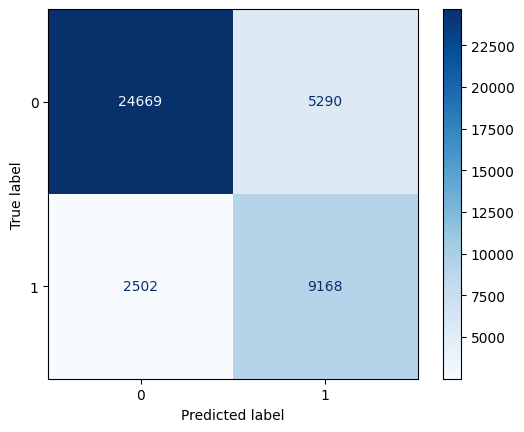

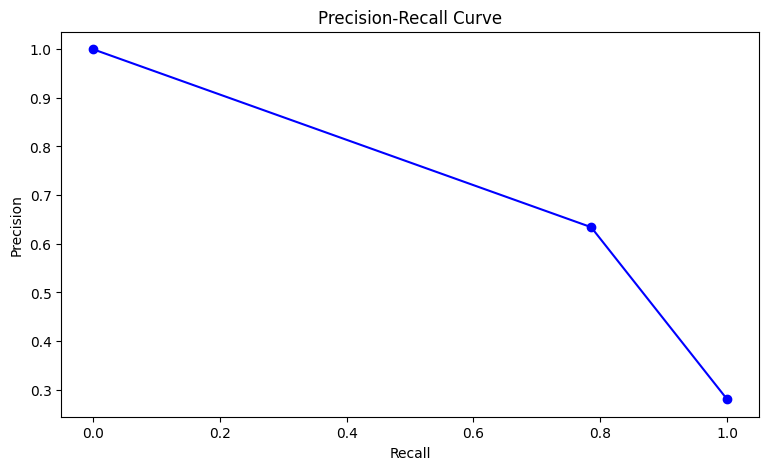

F1 Score: 0.7017758726270668
Accuracy: 0.8128227918037906
Precision: 0.6341126020196431
Recall: 0.7856041131105398
True Negatives: 24669
False Positives: 5290
False Negatives: 2502
True Positives: 9168
Specificity: 0.8234253479755667


In [45]:
# predict the model
y_pred = model.predict(test_generator)

# get the class with the highest probability
y_pred = np.argmax(y_pred, axis=1)

# get the true class
y_true = test_generator.classes

# get the class labels
class_labels = list(test_generator.class_indices.keys())

# get the classification report
print(classification_report(y_true, y_pred, target_names=class_labels))

# get the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap='Blues')

# get the precision recall curve
precision, recall, _ = precision_recall_curve(y_true, y_pred)

# plot the precision recall curve
plt.figure(figsize=(9, 5))
plt.plot(recall, precision, marker='b-', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# get the f1 score
f1 = f1_score(y_true, y_pred)
print(f'F1 Score: {f1}')

# get the accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f'Accuracy: {accuracy}')

# get the precision
precision = precision_score(y_true, y_pred)
print(f'Precision: {precision}')

# get the recall
recall = recall_score(y_true, y_pred)
print(f'Recall: {recall}')

#from the confusion matrix, calculate tn, fp, fn, tp
tn, fp, fn, tp = cm.ravel()
print(f'True Negatives: {tn}')
print(f'False Positives: {fp}')
print(f'False Negatives: {fn}')
print(f'True Positives: {tp}')

# calculate the specificity
specificity = tn / (tn + fp)
print(f'Specificity: {specificity}')




In [46]:
model.evaluate(test_generator)

1301/1301 [==============================] - 27s 21ms/step - loss: 0.4219 - accuracy: 0.8128


[0.4218797981739044, 0.8128228187561035]

In [47]:
images, labels = next(train_generator)

In [48]:
# Inspect the first image in the batch
first_image = images[0]

# Check the maximum and minimum values
max_value = first_image.max()
min_value = first_image.min()

print(f"Maximum pixel value: {max_value}")
print(f"Minimum pixel value: {min_value}")

Maximum pixel value: 0.7372549176216125
Minimum pixel value: 0.20000001788139343


## VGG 16

In [65]:
vgg_base = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(180, 180, 3)
    )

In [66]:
vgg_base.trainable = False

In [67]:
inputs = keras.Input(shape=(180, 180, 3))
x = keras.applications.vgg16.preprocess_input(inputs)
x = vgg_base(x)
x = layers.Dropout(0.25)(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(2, activation="softmax")(x)
model_vgg_finetuned = keras.Model(inputs, outputs)

In [68]:
vgg_base.trainable = True
for layer in vgg_base.layers[:-4]:
    layer.trainable = False

In [69]:
model_vgg_finetuned.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 tf.__operators__.getitem_2   (None, 180, 180, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 180, 180, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 12800)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               1638

In [70]:
model_vgg_finetuned.compile(loss="categorical_crossentropy",
              optimizer=keras.optimizers.Adadelta(),
              metrics=["accuracy"])

callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/finetune-vgg16.keras",
        save_best_only=True,
        monitor="val_loss")
]
history_vgg_finetuned = model_vgg_finetuned.fit(
    train_generator,
    epochs=12,
    batch_size=1024,
    class_weight=class_weights,
    validation_data=valid_generator,
    callbacks=callbacks)

Epoch 1/12
6071/6071 [==============================] - 2522s 415ms/step - loss: 0.6939 - accuracy: 0.5181 - val_loss: 0.6984 - val_accuracy: 0.2860
Epoch 2/12
6071/6071 [==============================] - 1000s 165ms/step - loss: 0.6932 - accuracy: 0.5079 - val_loss: 0.6946 - val_accuracy: 0.2860
Epoch 3/12
6071/6071 [==============================] - 1226s 202ms/step - loss: 0.6932 - accuracy: 0.4990 - val_loss: 0.6903 - val_accuracy: 0.7140
Epoch 4/12
 863/6071 [===>..........................] - ETA: 1:15:19 - loss: 0.6959 - accuracy: 0.3837

KeyboardInterrupt: 

In [ ]:
history_df_vgg_finetuned = pd.DataFrame(history_vgg_finetuned.history)
history_df_vgg_finetuned.insert(0, 'epoch', range(1, len(history_df_vgg_finetuned) + 1))
history_df_vgg_finetuned

,epoch,loss,accuracy,val_loss,val_accuracy
0,1,0.768852,0.534968,0.661330,0.638137
1,2,0.658532,0.615222,0.626669,0.663818
2,3,0.633195,0.648876,0.610023,0.671264
3,4,0.614975,0.668087,0.588496,0.694195
4,5,0.602072,0.680381,0.578502,0.700118
5,6,0.594014,0.687770,0.576064,0.702192
6,7,0.587167,0.693427,0.583505,0.694872
7,8,0.583271,0.698024,0.568290,0.708834
8,9,0.579839,0.700091,0.564396,0.712092
9,10,0.577093,0.703046,0.680026,0.626587


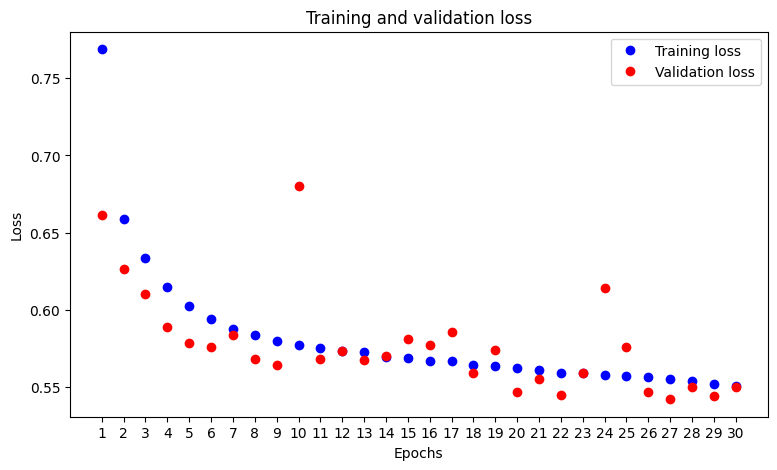

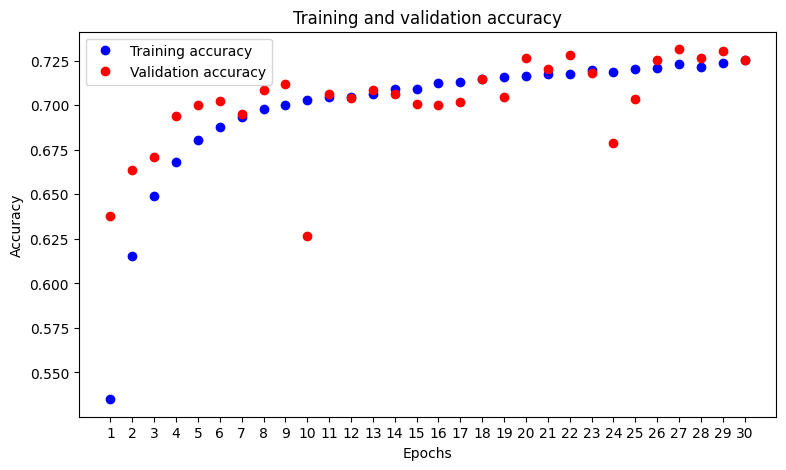

In [ ]:
# Plot the training and validation loss
plt.figure(figsize=(9, 5))
values = history_df_vgg_finetuned['accuracy']
epochs = range(1, len(values) + 1)
plt.plot(epochs, history_df_vgg_finetuned['loss'], 'bo', label='Training loss')
plt.plot(epochs, history_df_vgg_finetuned['val_loss'], 'ro', label='Validation loss')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Loss')
plt.legend()
plt.title('Training and validation loss')
plt.show()

# Plot the training and validation accuracy
plt.figure(figsize=(9, 5))
plt.plot(epochs, history_df_vgg_finetuned['accuracy'], 'bo', label='Training accuracy')
plt.plot(epochs, history_df_vgg_finetuned['val_accuracy'], 'ro', label='Validation accuracy')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and validation accuracy')
plt.show()

739/739 [==============================] - 44s 59ms/step
              precision    recall  f1-score   support

           0       0.78      0.61      0.69     11874
           1       0.68      0.83      0.75     11762

    accuracy                           0.72     23636
   macro avg       0.73      0.72      0.72     23636
weighted avg       0.73      0.72      0.72     23636



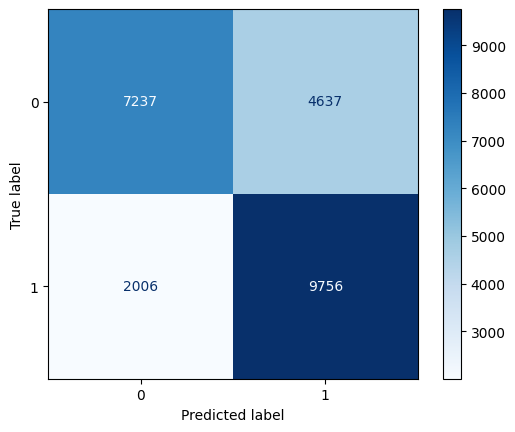

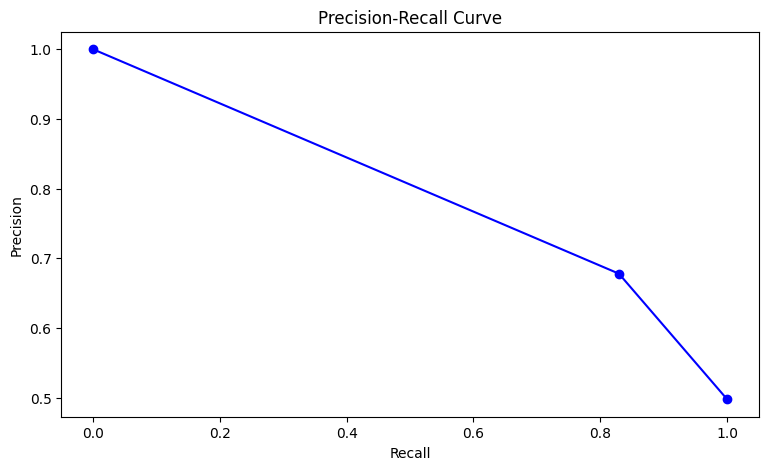

F1 Score: 0.7967166429349192
Accuracy: 0.7189456760873244
Precision: 0.6778295004516084
Recall: 0.829450773677946
True Negatives: 9270
False Positives: 2604
False Negatives: 2250
True Positives: 9512
Specificity: 0.7806973218797373


In [ ]:
# predict the model
y_pred_vgg_finetuned = model_vgg_finetuned.predict(test_generator)

# get the class with the highest probability
y_pred_vgg_finetuned = np.argmax(y_pred_vgg_finetuned, axis=1)

# get the true class
y_true = test_generator.classes

# get the class labels
class_labels = list(test_generator.class_indices.keys())

# get the classification report
print(classification_report(y_true, y_pred_vgg_finetuned, target_names=class_labels))

# get the confusion matrix
cm_vgg_finetuned = confusion_matrix(y_true, y_pred_vgg_finetuned)

# plot the confusion matrix
disp_vgg_finetuned = ConfusionMatrixDisplay(confusion_matrix=cm_vgg_finetuned, display_labels=class_labels)
disp_vgg_finetuned.plot(cmap='Blues')

# get the precision recall curve
precision_vgg_finetuned, recall_vgg_finetuned, _ = precision_recall_curve(y_true, y_pred_vgg_finetuned)

# plot the precision recall curve
plt.figure(figsize=(9, 5))
plt.plot(recall_vgg_finetuned, precision_vgg_finetuned, marker='o', color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# get the f1 score
f1_vgg_finetuned = f1_score(y_true, y_pred_vgg_finetuned)
print(f'F1 Score: {f1}')

# get the accuracy
accuracy_vgg_finetuned = accuracy_score(y_true, y_pred_vgg_finetuned)
print(f'Accuracy: {accuracy_vgg_finetuned}')

# get the precision
precision_vgg_finetuned = precision_score(y_true, y_pred_vgg_finetuned)
print(f'Precision: {precision_vgg_finetuned}')

# get the recall
recall_vgg_finetuned = recall_score(y_true, y_pred_vgg_finetuned)
print(f'Recall: {recall_vgg_finetuned}')

#from the confusion matrix, calculate tn, fp, fn, tp
tn_vgg_finetuned, fp_vgg_finetuned, fn_vgg_finetuned, tp_vgg_finetuned = cm.ravel()
print(f'True Negatives: {tn_vgg_finetuned}')
print(f'False Positives: {fp_vgg_finetuned}')
print(f'False Negatives: {fn_vgg_finetuned}')
print(f'True Positives: {tp_vgg_finetuned}')

# calculate the specificity
specificity_vgg_finetuned = tn_vgg_finetuned / (tn_vgg_finetuned + fp_vgg_finetuned)
print(f'Specificity: {specificity_vgg_finetuned}')




## VGG 16

In [ ]:
conv_base = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(180, 180, 3)
    )

In [ ]:
conv_base.trainable = False

In [ ]:
inputs = keras.Input(shape=(180, 180, 3))
x = keras.applications.vgg16.preprocess_input(inputs)
x = conv_base(x)
x = layers.Flatten()(x)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(2, activation="softmax")(x)
model_vgg = keras.Model(inputs, outputs)

In [ ]:
model_vgg.compile(loss="categorical_crossentropy",
              optimizer='adam',
              metrics=["accuracy"])

callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/vgg16.keras",
        save_best_only=True,
        monitor="val_loss")
]
history_vgg = model_vgg.fit(
    train_generator,
    epochs=2,
    batch_size=1024,
    class_weight=class_weights,
    validation_data=valid_generator,
    callbacks=callbacks)

Epoch 1/8
6071/6071 [==============================] - 907s 149ms/step - loss: 0.7045 - accuracy: 0.6097 - val_loss: 0.5696 - val_accuracy: 0.6904
Epoch 2/8
6071/6071 [==============================] - 946s 156ms/step - loss: 0.6498 - accuracy: 0.6260 - val_loss: 0.8879 - val_accuracy: 0.4115
Epoch 3/8
6071/6071 [==============================] - 914s 151ms/step - loss: 0.6399 - accuracy: 0.6364 - val_loss: 0.7797 - val_accuracy: 0.5255
Epoch 4/8
6071/6071 [==============================] - 920s 151ms/step - loss: 0.6350 - accuracy: 0.6434 - val_loss: 0.6032 - val_accuracy: 0.6568
Epoch 5/8
4964/6071 [=======================>......] - ETA: 2:48 - loss: 0.6301 - accuracy: 0.6483

KeyboardInterrupt: 

In [ ]:
history_df_vgg = pd.DataFrame(history_vgg.history)
history_df_vgg.insert(0, 'epoch', range(1, len(history_df_vgg) + 1))
history_df_vgg

,epoch,loss,accuracy,val_loss,val_accuracy
0,1,0.768852,0.534968,0.661330,0.638137
1,2,0.658532,0.615222,0.626669,0.663818
2,3,0.633195,0.648876,0.610023,0.671264
3,4,0.614975,0.668087,0.588496,0.694195
4,5,0.602072,0.680381,0.578502,0.700118
5,6,0.594014,0.687770,0.576064,0.702192
6,7,0.587167,0.693427,0.583505,0.694872
7,8,0.583271,0.698024,0.568290,0.708834
8,9,0.579839,0.700091,0.564396,0.712092
9,10,0.577093,0.703046,0.680026,0.626587


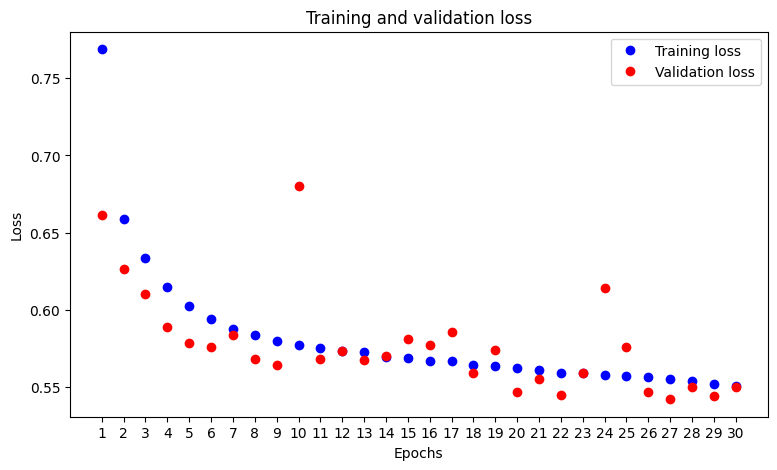

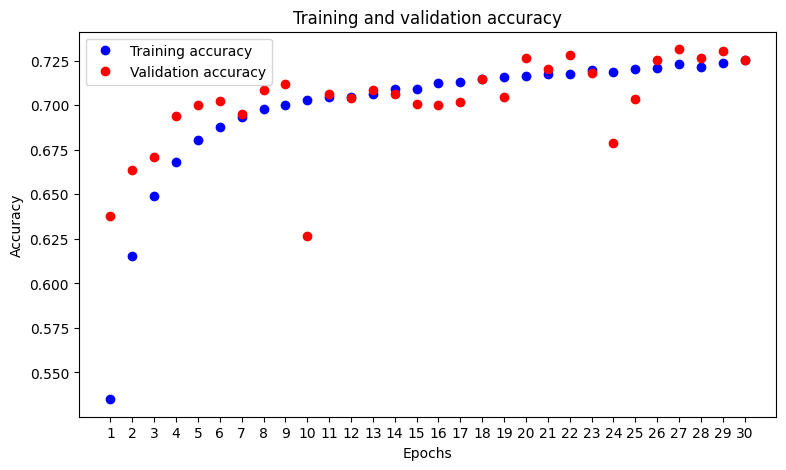

In [ ]:
# Plot the training and validation loss
plt.figure(figsize=(9, 5))
values = history_df_vgg['accuracy']
epochs = range(1, len(values) + 1)
plt.plot(epochs, history_df_vgg['loss'], 'bo', label='Training loss')
plt.plot(epochs, history_df_vgg['val_loss'], 'ro', label='Validation loss')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Loss')
plt.legend()
plt.title('Training and validation loss')
plt.show()

# Plot the training and validation accuracy
plt.figure(figsize=(9, 5))
plt.plot(epochs, history_df_vgg['accuracy'], 'bo', label='Training accuracy')
plt.plot(epochs, history_df_vgg['val_accuracy'], 'ro', label='Validation accuracy')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and validation accuracy')
plt.show()

739/739 [==============================] - 44s 59ms/step
              precision    recall  f1-score   support

           0       0.78      0.61      0.69     11874
           1       0.68      0.83      0.75     11762

    accuracy                           0.72     23636
   macro avg       0.73      0.72      0.72     23636
weighted avg       0.73      0.72      0.72     23636



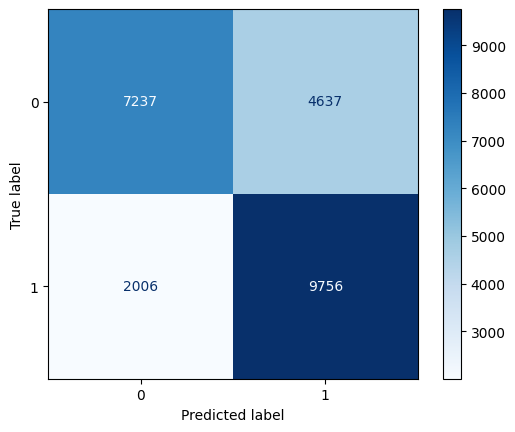

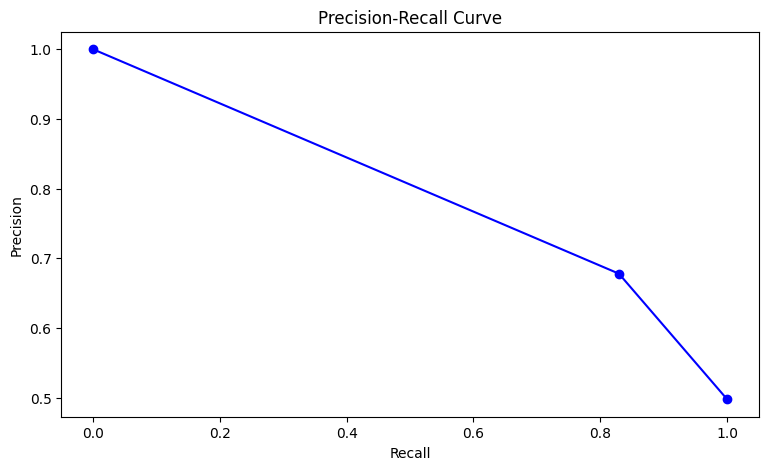

F1 Score: 0.7967166429349192
Accuracy: 0.7189456760873244
Precision: 0.6778295004516084
Recall: 0.829450773677946
True Negatives: 9270
False Positives: 2604
False Negatives: 2250
True Positives: 9512
Specificity: 0.7806973218797373


In [ ]:
# predict the model
y_pred_vgg = model_vgg.predict(test_generator)

# get the class with the highest probability
y_pred_vgg = np.argmax(y_pred_vgg, axis=1)

# get the true class
y_true = test_generator.classes

# get the class labels
class_labels = list(test_generator.class_indices.keys())

# get the classification report
print(classification_report(y_true, y_pred_vgg, target_names=class_labels))

# get the confusion matrix
cm_vgg = confusion_matrix(y_true, y_pred_vgg)

# plot the confusion matrix
disp_vgg = ConfusionMatrixDisplay(confusion_matrix=cm_vgg, display_labels=class_labels)
disp_vgg.plot(cmap='Blues')

# get the precision recall curve
precision_vgg, recall_vgg, _ = precision_recall_curve(y_true, y_pred_vgg)

# plot the precision recall curve
plt.figure(figsize=(9, 5))
plt.plot(recall_vgg, precision_vgg, marker='o', color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# get the f1 score
f1_vgg = f1_score(y_true, y_pred_vgg)
print(f'F1 Score: {f1}')

# get the accuracy
accuracy_vgg = accuracy_score(y_true, y_pred_vgg)
print(f'Accuracy: {accuracy_vgg}')

# get the precision
precision_vgg = precision_score(y_true, y_pred_vgg)
print(f'Precision: {precision_vgg}')

# get the recall
recall_vgg = recall_score(y_true, y_pred_vgg)
print(f'Recall: {recall_vgg}')

#from the confusion matrix, calculate tn, fp, fn, tp
tn_vgg, fp_vgg, fn_vgg, tp_vgg = cm.ravel()
print(f'True Negatives: {tn_vgg}')
print(f'False Positives: {fp_vgg}')
print(f'False Negatives: {fn_vgg}')
print(f'True Positives: {tp_vgg}')

# calculate the specificity
specificity_vgg = tn_vgg / (tn_vgg + fp_vgg)
print(f'Specificity: {specificity_vgg}')




## RestNet

In [55]:
restnet_base = keras.applications.ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(180, 180, 3)
    )

In [56]:
restnet_base.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 180, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 186, 186, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 90, 90, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 90, 90, 64)   256         ['conv1_conv[0][0]']      

In [57]:
restnet_base.trainable = False

In [58]:
inputs = keras.Input(shape=(180, 180, 3))
x = keras.applications.resnet50.preprocess_input(inputs)
x = restnet_base(x)
x = layers.Flatten()(x)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(2, activation="softmax")(x)
model_restnet = keras.Model(inputs, outputs)

In [59]:
model_restnet.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 tf.__operators__.getitem_1   (None, 180, 180, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 180, 180, 3)      0         
 a)                                                              
                                                                 
 resnet50 (Functional)       (None, 6, 6, 2048)        23587712  
                                                                 
 flatten_2 (Flatten)         (None, 73728)             0         
                                                                 
 dense_4 (Dense)             (None, 256)               1887

In [60]:
model_restnet.compile(loss="categorical_crossentropy",
              optimizer='adam',
              metrics=["accuracy"])

callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/finetune-restnet.keras",
        save_best_only=True,
        monitor="val_loss")
]
history_restnet = model_restnet.fit(
    train_generator,
    epochs=2,
    batch_size=1024,
    validation_data=valid_generator,
    class_weight=class_weights,
    callbacks=callbacks)

Epoch 1/2
6071/6071 [==============================] - 2189s 360ms/step - loss: 1.0980 - accuracy: 0.6405 - val_loss: 0.6839 - val_accuracy: 0.6081
Epoch 2/2
6071/6071 [==============================] - 775s 128ms/step - loss: 0.6996 - accuracy: 0.6510 - val_loss: 0.5971 - val_accuracy: 0.6933


In [61]:
history_df_restnet = pd.DataFrame(history_restnet.history)
history_df_restnet.insert(0, 'epoch', range(1, len(history_df_restnet) + 1))
history_df_restnet

,epoch,loss,accuracy,val_loss,val_accuracy
0,1,1.098048,0.640462,0.683891,0.608062
1,2,0.699643,0.650958,0.597101,0.693291


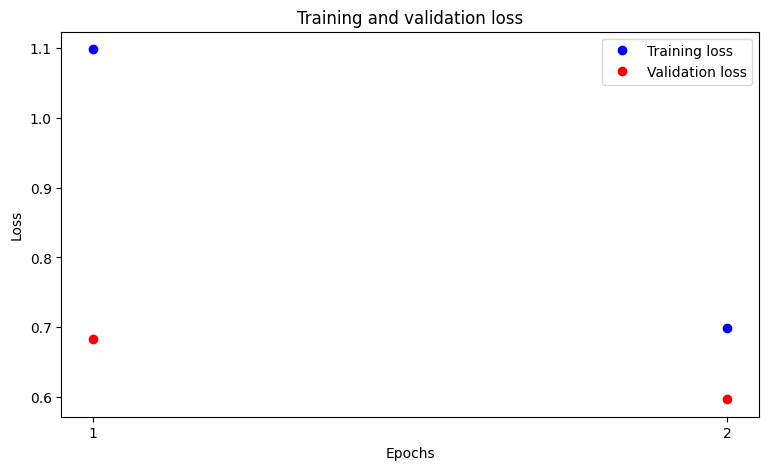

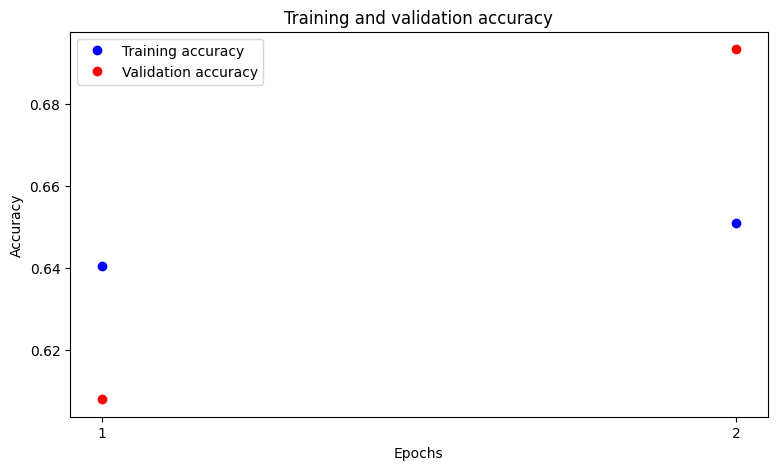

In [62]:
# Plot the training and validation loss
plt.figure(figsize=(9, 5))
values = history_df_restnet['accuracy']
epochs = range(1, len(values) + 1)
plt.plot(epochs, history_df_restnet['loss'], 'bo', label='Training loss')
plt.plot(epochs, history_df_restnet['val_loss'], 'ro', label='Validation loss')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Loss')
plt.legend()
plt.title('Training and validation loss')
plt.show()

# Plot the training and validation accuracy
plt.figure(figsize=(9, 5))
plt.plot(epochs, history_df_restnet['accuracy'], 'bo', label='Training accuracy')
plt.plot(epochs, history_df_restnet['val_accuracy'], 'ro', label='Validation accuracy')

plt.xlabel('Epochs')
plt.xticks(epochs)
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and validation accuracy')
plt.show()

1301/1301 [==============================] - 51s 39ms/step
              precision    recall  f1-score   support

           0       0.89      0.65      0.75     29959
           1       0.47      0.80      0.59     11670

    accuracy                           0.69     41629
   macro avg       0.68      0.72      0.67     41629
weighted avg       0.77      0.69      0.71     41629



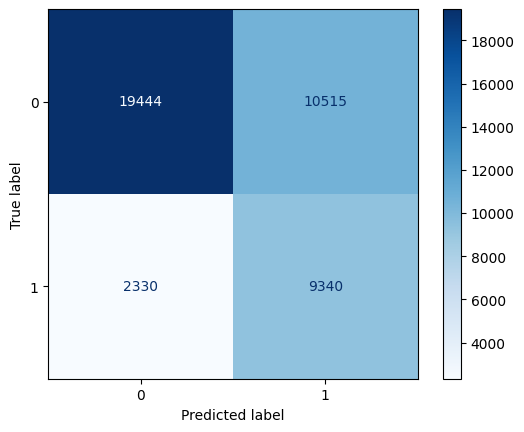

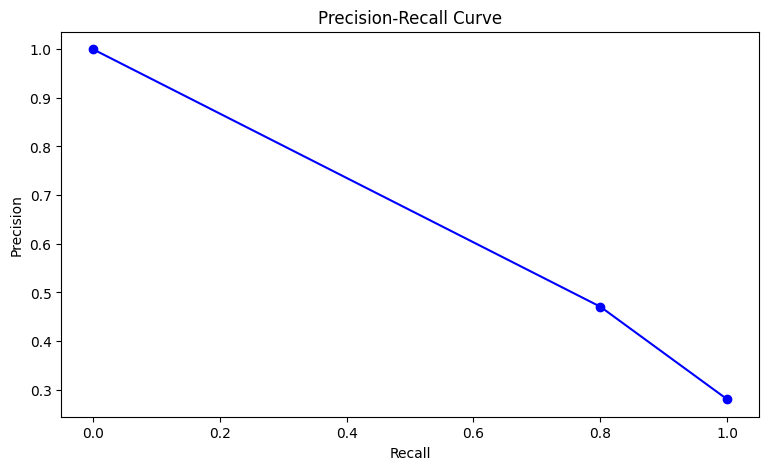

F1 Score: 0.7017758726270668
Accuracy: 0.6914410627206995
Precision: 0.47041047595064217
Recall: 0.8003427592116538
True Negatives: 24669
False Positives: 5290
False Negatives: 2502
True Positives: 9168
Specificity: 0.8234253479755667


In [64]:
# predict the model
y_pred_restnet = model_restnet.predict(test_generator)

# get the class with the highest probability
y_pred_restnet = np.argmax(y_pred_restnet, axis=1)

# get the true class
y_true = test_generator.classes

# get the class labels
class_labels = list(test_generator.class_indices.keys())

# get the classification report
print(classification_report(y_true, y_pred_restnet, target_names=class_labels))

# get the confusion matrix
cm_restnet = confusion_matrix(y_true, y_pred_restnet)

# plot the confusion matrix
disp_restnet = ConfusionMatrixDisplay(confusion_matrix=cm_restnet, display_labels=class_labels)
disp_restnet.plot(cmap='Blues')

# get the precision recall curve
precision_restnet, recall_restnet, _ = precision_recall_curve(y_true, y_pred_restnet)

# plot the precision recall curve
plt.figure(figsize=(9, 5))
plt.plot(recall_restnet, precision_restnet, marker='o', color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# get the f1 score
f1_restnet = f1_score(y_true, y_pred_restnet)
print(f'F1 Score: {f1}')

# get the accuracy
accuracy_restnet = accuracy_score(y_true, y_pred_restnet)
print(f'Accuracy: {accuracy_restnet}')

# get the precision
precision_restnet = precision_score(y_true, y_pred_restnet)
print(f'Precision: {precision_restnet}')

# get the recall
recall_restnet = recall_score(y_true, y_pred_restnet)
print(f'Recall: {recall_restnet}')

#from the confusion matrix, calculate tn, fp, fn, tp
tn_restnet, fp_restnet, fn_restnet, tp_restnet = cm.ravel()
print(f'True Negatives: {tn_restnet}')
print(f'False Positives: {fp_restnet}')
print(f'False Negatives: {fn_restnet}')
print(f'True Positives: {tp_restnet}')

# calculate the specificity
specificity_restnet = tn_restnet / (tn_restnet + fp_restnet)
print(f'Specificity: {specificity_restnet}')


